#Merged

In [ ]:
import pandas as pd

# Baca masing-masing file dengan aman
humidity = pd.read_csv('/content/humidity.csv', on_bad_lines='skip')
pressure = pd.read_csv('/content/pressure.csv', on_bad_lines='skip')
temperature = pd.read_csv('/content/temperature.csv', on_bad_lines='skip')
wind_direction = pd.read_csv('/content/wind_direction.csv', on_bad_lines='skip')
wind_speed = pd.read_csv('/content/wind_speed.csv', on_bad_lines='skip')

# Tampilkan jumlah baris tiap dataset
print("Jumlah baris humidity:", len(humidity))
print("Jumlah baris pressure:", len(pressure))
print("Jumlah baris temperature:", len(temperature))
print("Jumlah baris wind_direction:", len(wind_direction))
print("Jumlah baris wind_speed:", len(wind_speed))


Jumlah baris humidity: 31391
Jumlah baris pressure: 19559
Jumlah baris temperature: 45253
Jumlah baris wind_direction: 23322
Jumlah baris wind_speed: 31714


In [ ]:
# Cari jumlah baris terkecil
min_len = min(len(humidity), len(pressure), len(temperature), len(wind_direction), len(wind_speed))

# Samakan jumlah baris semua dataset
humidity = humidity.head(min_len)
pressure = pressure.head(min_len)
temperature = temperature.head(min_len)
wind_direction = wind_direction.head(min_len)
wind_speed = wind_speed.head(min_len)

# Cek hasil akhir
print("\nJumlah baris setelah disamakan:")
print("humidity:", len(humidity))
print("pressure:", len(pressure))
print("temperature:", len(temperature))
print("wind_direction:", len(wind_direction))
print("wind_speed:", len(wind_speed))



Jumlah baris setelah disamakan:
humidity: 19559
pressure: 19559
temperature: 19559
wind_direction: 19559
wind_speed: 19559


In [ ]:
import pandas as pd

# === 1. Baca semua file ===
humidity = pd.read_csv('humidity.csv', on_bad_lines='skip')
pressure = pd.read_csv('pressure.csv', on_bad_lines='skip')
temperature = pd.read_csv('temperature.csv', on_bad_lines='skip')
wind_speed = pd.read_csv('wind_speed.csv', on_bad_lines='skip')
wind_desc = pd.read_csv('/content/wind_direction.csv', on_bad_lines='skip')

# === 2. Ubah kolom datetime ke format tanggal ===
for df in [humidity, pressure, temperature, wind_speed, wind_desc]:
    df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')

# === 3. Ambil hanya tahun 2013 dan kota New York ===
humidity = humidity[humidity['datetime'].dt.year == 2013][['datetime', 'New York']].rename(columns={'New York': 'humidity'})
pressure = pressure[pressure['datetime'].dt.year == 2013][['datetime', 'New York']].rename(columns={'New York': 'pressure'})
temperature = temperature[temperature['datetime'].dt.year == 2013][['datetime', 'New York']].rename(columns={'New York': 'temperature'})
wind_speed = wind_speed[wind_speed['datetime'].dt.year == 2013][['datetime', 'New York']].rename(columns={'New York': 'wind_speed'})
wind_desc = wind_desc[wind_desc['datetime'].dt.year == 2013][['datetime', 'New York']].rename(columns={'New York': 'wind_direction'})

# === 4. Gabungkan semua dataframe berdasarkan datetime ===
weather = (
    humidity.merge(pressure, on='datetime', how='inner')
            .merge(temperature, on='datetime', how='inner')
            .merge(wind_speed, on='datetime', how='inner')
            .merge(wind_desc, on='datetime', how='inner')
)

# === 5. Lihat hasil ===
print(weather.head())
print(weather.info())

# === 6. Simpan hasilnya ===
weather.to_csv('weather_newyork_2013.csv', index=False)


             datetime  humidity  pressure  temperature  wind_speed  \
0 2013-01-01 00:00:00       NaN    1019.0       272.03        13.0   
1 2013-01-01 01:00:00      54.0    1020.0       271.46        11.0   
2 2013-01-01 02:00:00      54.0    1021.0       271.19         8.0   
3 2013-01-01 03:00:00      54.0    1021.0       271.07         9.0   
4 2013-01-01 04:00:00      54.0    1021.0       270.83         8.0   

   wind_direction  
0           310.0  
1           310.0  
2           330.0  
3           300.0  
4           300.0  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   datetime        8760 non-null   datetime64[ns]
 1   humidity        8279 non-null   float64       
 2   pressure        8644 non-null   float64       
 3   temperature     8760 non-null   float64       
 4   wind_speed      8760 non-null   floa

In [ ]:
df = pd.read_csv('/content/weather_newyork_2013.csv')
df.head()

,datetime,humidity,pressure,temperature,wind_speed,wind_direction
0,2013-01-01 00:00:00,NaN,1019.0,272.03,13.0,310.0
1,2013-01-01 01:00:00,54.0,1020.0,271.46,11.0,310.0
2,2013-01-01 02:00:00,54.0,1021.0,271.19,8.0,330.0
3,2013-01-01 03:00:00,54.0,1021.0,271.07,9.0,300.0
4,2013-01-01 04:00:00,54.0,1021.0,270.83,8.0,300.0


In [ ]:
import pandas as pd

# Baca kedua file
flights = pd.read_csv('/content/flights.csv')
weather = pd.read_csv('/content/weather_newyork_2013.csv')

# Pastikan kolom waktu sama format
flights['time_hour'] = pd.to_datetime(flights['time_hour'], errors='coerce')
weather['datetime'] = pd.to_datetime(weather['datetime'], errors='coerce')

# Rename the 'time_hour' column in flights to 'datetime' for merging
flights = flights.rename(columns={'time_hour': 'datetime'})

# Gabungkan berdasarkan kolom datetime
merged = pd.merge(flights, weather, on='datetime', how='left')

# Lihat hasil
print(merged.head())
print(merged.info())

# Simpan hasil gabungan
merged.to_csv('/content/flights_weather_merged.csv', index=False)

   id  year  month  day  dep_time  sched_dep_time  dep_delay  arr_time  \
0   0  2013      1    1     517.0             515        2.0     830.0   
1   1  2013      1    1     533.0             529        4.0     850.0   
2   2  2013      1    1     542.0             540        2.0     923.0   
3   3  2013      1    1     544.0             545       -1.0    1004.0   
4   4  2013      1    1     554.0             600       -6.0     812.0   

   sched_arr_time  arr_delay  ... distance  hour minute            datetime  \
0             819       11.0  ...     1400     5     15 2013-01-01 05:00:00   
1             830       20.0  ...     1416     5     29 2013-01-01 05:00:00   
2             850       33.0  ...     1089     5     40 2013-01-01 05:00:00   
3            1022      -18.0  ...     1576     5     45 2013-01-01 05:00:00   
4             837      -25.0  ...      762     6      0 2013-01-01 06:00:00   

                     name  humidity  pressure  temperature  wind_speed  \
0   Un

#Cleaning dan Transformasi Data

In [ ]:
from datetime import time
import pandas as pd

df = pd.read_csv('/content/flights_weather_merged.csv')
print("Jumlah baris flight:", len(df))
df

Jumlah baris flight: 49629


,id,year,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,...,distance,hour,minute,datetime,name,humidity,pressure,temperature,wind_speed,wind_direction
0,0,2013,1,1,517.0,515,2.0,830.0,819,11.0,...,1400,5,15,2013-01-01 05:00:00,United Air Lines Inc.,54.0,1022.0,270.64,6.0,300.0
1,1,2013,1,1,533.0,529,4.0,850.0,830,20.0,...,1416,5,29,2013-01-01 05:00:00,United Air Lines Inc.,54.0,1022.0,270.64,6.0,300.0
2,2,2013,1,1,542.0,540,2.0,923.0,850,33.0,...,1089,5,40,2013-01-01 05:00:00,American Airlines Inc.,54.0,1022.0,270.64,6.0,300.0
3,3,2013,1,1,544.0,545,-1.0,1004.0,1022,-18.0,...,1576,5,45,2013-01-01 05:00:00,JetBlue Airways,54.0,1022.0,270.64,6.0,300.0
4,4,2013,1,1,554.0,600,-6.0,812.0,837,-25.0,...,762,6,0,2013-01-01 06:00:00,Delta Air Lines Inc.,NaN,NaN,269.98,1.0,292.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49624,49624,2013,10,25,803.0,810,-7.0,1104.0,1119,-15.0,...,2434,8,10,2013-10-25 08:00:00,United Air Lines Inc.,71.0,981.0,276.35,3.0,244.0
49625,49625,2013,10,25,803.0,755,8.0,912.0,910,2.0,...,711,7,55,2013-10-25 07:00:00,Southwest Airlines Co.,69.0,981.0,275.95,3.0,244.0
49626,49626,2013,10,25,803.0,805,-2.0,1102.0,1106,-4.0,...,1010,8,5,2013-10-25 08:00:00,Delta Air Lines Inc.,71.0,981.0,276.35,3.0,244.0
49627,49627,2013,10,25,804.0,810,-6.0,937.0,955,-18.0,...,419,8,10,2013-10-25 08:00:00,Envoy Air,71.0,981.0,276.35,3.0,244.0


In [ ]:
df.info()
df.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49629 entries, 0 to 49628
Data columns (total 26 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              49629 non-null  int64  
 1   year            49629 non-null  int64  
 2   month           49629 non-null  int64  
 3   day             49629 non-null  int64  
 4   dep_time        48901 non-null  float64
 5   sched_dep_time  49629 non-null  int64  
 6   dep_delay       48901 non-null  float64
 7   arr_time        48879 non-null  float64
 8   sched_arr_time  49629 non-null  int64  
 9   arr_delay       48790 non-null  float64
 10  carrier         49629 non-null  object 
 11  flight          49629 non-null  int64  
 12  tailnum         49401 non-null  object 
 13  origin          49629 non-null  object 
 14  dest            49629 non-null  object 
 15  air_time        48790 non-null  float64
 16  distance        49629 non-null  int64  
 17  hour            49629 non-null 

,0
id,0
year,0
month,0
day,0
dep_time,728
sched_dep_time,0
dep_delay,728
arr_time,750
sched_arr_time,0
arr_delay,839


In [ ]:
# === HANDLING MISSING VALUES (FINAL) ===

import pandas as pd
import numpy as np

# 1️⃣ Cek jumlah nilai NaN awal
print("Jumlah nilai NaN per kolom sebelum imputasi:\n")
print(df.isnull().sum().sort_values(ascending=False).head(15))

# 2️⃣ Drop baris dengan NaN pada kolom utama
df_clean = df.dropna(subset=['arr_delay', 'dep_delay', 'air_time']).copy()

# 3️⃣ Imputasi kolom cuaca numerik
for col in ['humidity', 'pressure', 'temperature', 'wind_speed']:
    if col in df_clean.columns:
        df_clean[col] = df_clean[col].fillna(df_clean[col].mean())

# 4️⃣ Imputasi kolom kategorikal
for col in ['tailnum', 'origin', 'dest', 'carrier']:
    if col in df_clean.columns and df_clean[col].isnull().any():
        df_clean[col] = df_clean[col].fillna(df_clean[col].mode()[0])

# 5️⃣ Imputasi waktu kosong pakai jadwalnya
if 'dep_time' in df_clean.columns and 'sched_dep_time' in df_clean.columns:
    df_clean['dep_time'] = df_clean['dep_time'].fillna(df_clean['sched_dep_time'])

if 'arr_time' in df_clean.columns and 'sched_arr_time' in df_clean.columns:
    df_clean['arr_time'] = df_clean['arr_time'].fillna(df_clean['sched_arr_time'])

# 6️⃣ Imputasi sisa kolom numerik & kategorikal
for col in df_clean.columns:
    if df_clean[col].isnull().any():
        if df_clean[col].dtype in ['float64', 'int64']:
            df_clean[col] = df_clean[col].fillna(df_clean[col].mean())
        else:
            df_clean[col] = df_clean[col].fillna(df_clean[col].mode()[0])

# 7️⃣ Jika masih ada NaN tersisa, hapus seluruh barisnya
df_clean = df_clean.dropna()

# 8️⃣ Cek ulang jumlah NaN (harus 0 semua)
print("\nJumlah nilai NaN setelah semua tahap:\n")
print(df_clean.isnull().sum().sort_values(ascending=False))

# 9️⃣ Ukuran data akhir
print("\nUkuran data setelah pembersihan:", df_clean.shape)

# 10️⃣ Verifikasi total NaN benar-benar 0
print("\nTotal nilai NaN di seluruh DataFrame:", df_clean.isnull().sum().sum())


Jumlah nilai NaN per kolom sebelum imputasi:

humidity          1412
arr_delay          839
air_time           839
arr_time           750
dep_time           728
dep_delay          728
pressure           282
tailnum            228
name                 1
datetime             1
wind_direction       1
wind_speed           1
temperature          1
month                0
id                   0
dtype: int64

Jumlah nilai NaN setelah semua tahap:

id                0
year              0
month             0
day               0
dep_time          0
sched_dep_time    0
dep_delay         0
arr_time          0
sched_arr_time    0
arr_delay         0
carrier           0
flight            0
tailnum           0
origin            0
dest              0
air_time          0
distance          0
hour              0
minute            0
datetime          0
name              0
humidity          0
pressure          0
temperature       0
wind_speed        0
wind_direction    0
dtype: int64

Ukuran data setelah pe

In [ ]:
# === Deduplication ===
print("Jumlah data duplikat sebelum dibersihkan:", df.duplicated().sum())

# Hapus baris duplikat (jika ada)
df = df.drop_duplicates()

print("Jumlah data duplikat setelah dibersihkan:", df.duplicated().sum())


Jumlah data duplikat sebelum dibersihkan: 0
Jumlah data duplikat setelah dibersihkan: 0


In [ ]:
# === Operasi Aritmatika dengan NaN ===

# Buat kolom baru: selisih antara arr_delay dan dep_delay
df_clean['delay_difference'] = df_clean['arr_delay'] - df_clean['dep_delay']

# Buat kolom baru total delay, NaN dianggap 0
df_clean['total_delay'] = df_clean['arr_delay'].fillna(0) + df_clean['dep_delay'].fillna(0)

# Cek beberapa data
df_clean[['arr_delay', 'dep_delay', 'delay_difference', 'total_delay']].head(10)


,arr_delay,dep_delay,delay_difference,total_delay
0,11.0,2.0,9.0,13.0
1,20.0,4.0,16.0,24.0
2,33.0,2.0,31.0,35.0
3,-18.0,-1.0,-17.0,-19.0
4,-25.0,-6.0,-19.0,-31.0
5,12.0,-4.0,16.0,8.0
6,19.0,-5.0,24.0,14.0
7,-14.0,-3.0,-11.0,-17.0
8,-8.0,-3.0,-5.0,-11.0
9,8.0,-2.0,10.0,6.0


In [ ]:
# === Reshaping Data (Melt → Pivot) ===

# Ambil subset kecil biar jelas strukturnya
# Removed 'month' as it was dropped earlier.
subset = df_clean[['origin', 'arr_delay', 'dep_delay']].head(20)

# Wide → Long (melt)
melted = subset.melt(
    id_vars=['origin'], # Removed 'month'
    value_vars=['arr_delay', 'dep_delay'],
    var_name='delay_type',
    value_name='delay_time'
)

print("Hasil melt:")
print(melted.head())

# Long → Wide (pivot)
pivoted = melted.pivot_table(
    index=['origin'], # Removed 'month'
    columns='delay_type',
    values='delay_time',
    aggfunc='mean'
).reset_index()

print("\nHasil pivot:")
print(pivoted.head())

Hasil melt:
  origin delay_type  delay_time
0    EWR  arr_delay        11.0
1    LGA  arr_delay        20.0
2    JFK  arr_delay        33.0
3    JFK  arr_delay       -18.0
4    LGA  arr_delay       -25.0

Hasil pivot:
delay_type origin  arr_delay  dep_delay
0             EWR   2.333333  -1.500000
1             JFK   0.714286  -1.142857
2             LGA   3.571429  -1.142857


In [ ]:
print(df_clean['temperature'].describe())


count    48790.000000
mean       280.932054
std          8.892775
min        261.220000
25%        274.670000
50%        280.400000
75%        288.500000
max        301.730000
Name: temperature, dtype: float64


In [ ]:
# === Binning Temperature (konversi dari Kelvin ke Celcius) ===

# Konversi suhu dari Kelvin ke Celcius
df_clean['temperature_c'] = df_clean['temperature'] - 273.15

# Buat kategori suhu berdasarkan Celcius
df_clean['temp_category'] = pd.cut(
    df_clean['temperature_c'],
    bins=[-float('inf'), 0, 15, 30, float('inf')],
    labels=['Dingin', 'Sejuk', 'Hangat', 'Panas']
)

# Cek hasil distribusi
print("Distribusi kategori suhu (setelah konversi dari Kelvin):")
print(df_clean['temp_category'].value_counts())



Distribusi kategori suhu (setelah konversi dari Kelvin):
temp_category
Sejuk     26407
Hangat    12811
Dingin     9572
Panas         0
Name: count, dtype: int64


In [ ]:
import pandas as pd

# === 8. Ubah kolom waktu jadi datetime yang benar ===
# Pastikan dulu kamu punya kolom tahun, bulan, hari (atau 'date')
if {'year', 'month', 'day'}.issubset(df_clean.columns):
    # Buat kolom 'date' kalau belum ada
    df_clean['date'] = pd.to_datetime(df_clean[['year', 'month', 'day']])

# Fungsi bantu buat ubah jam seperti 517 -> 05:17
def convert_time_to_str(t):
    """Konversi waktu numerik seperti 517 -> '05:17'"""
    try:
        t = int(t)
        hour = t // 100
        minute = t % 100
        return f"{hour:02d}:{minute:02d}"
    except:
        return None

# Kolom waktu yang berformat jam (HHMM)
kolom_jam = ['dep_time', 'arr_time', 'sched_dep_time', 'sched_arr_time']

for col in kolom_jam:
    if col in df_clean.columns:
        df_clean[col] = df_clean[col].apply(convert_time_to_str)
        df_clean[col] = pd.to_datetime(df_clean['date'].astype(str) + ' ' + df_clean[col].astype(str),
                                       errors='coerce')

# === 9. Pastikan kolom delay tetap numerik ===
for delay_col in ['dep_delay', 'arr_delay']:
    if delay_col in df_clean.columns:
        df_clean[delay_col] = pd.to_numeric(df_clean[delay_col], errors='coerce')

# Cek hasil
df_clean[['date', 'dep_time', 'sched_dep_time', 'arr_time', 'sched_arr_time']].head()


,date,dep_time,sched_dep_time,arr_time,sched_arr_time
0,2013-01-01,2013-01-01 05:17:00,2013-01-01 05:15:00,2013-01-01 08:30:00,2013-01-01 08:19:00
1,2013-01-01,2013-01-01 05:33:00,2013-01-01 05:29:00,2013-01-01 08:50:00,2013-01-01 08:30:00
2,2013-01-01,2013-01-01 05:42:00,2013-01-01 05:40:00,2013-01-01 09:23:00,2013-01-01 08:50:00
3,2013-01-01,2013-01-01 05:44:00,2013-01-01 05:45:00,2013-01-01 10:04:00,2013-01-01 10:22:00
4,2013-01-01,2013-01-01 05:54:00,2013-01-01 06:00:00,2013-01-01 08:12:00,2013-01-01 08:37:00


In [ ]:
# Hapus kolom yang tidak relevan dari df_clean, bukan df
df_clean = df_clean.drop(columns=[
    'id', 'name', 'wind_description',
    'dep_hour','dep_minute','arr_hour','arr_minute',
    'hour','minute','year','month','day','time_hour', 'datetime'
], errors='ignore')

# Cek NaN setelah hapus kolom
print(df_clean.isnull().sum())


dep_time             0
sched_dep_time       0
dep_delay            0
arr_time            23
sched_arr_time       0
arr_delay            0
carrier              0
flight               0
tailnum              0
origin               0
dest                 0
air_time             0
distance             0
humidity             0
pressure             0
temperature          0
wind_speed           0
wind_direction       0
delay_difference     0
total_delay          0
temperature_c        0
temp_category        0
date                 0
dtype: int64


In [ ]:
# Isi dengan waktu yang dijadwalkan jika kosong
df_clean['dep_time'] = df_clean['dep_time'].fillna(df_clean['sched_dep_time'])
df_clean['arr_time'] = df_clean['arr_time'].fillna(df_clean['sched_arr_time'])

# Cek lagi
print(df_clean.isnull().sum())


dep_time            0
sched_dep_time      0
dep_delay           0
arr_time            0
sched_arr_time      0
arr_delay           0
carrier             0
flight              0
tailnum             0
origin              0
dest                0
air_time            0
distance            0
humidity            0
pressure            0
temperature         0
wind_speed          0
wind_direction      0
delay_difference    0
total_delay         0
temperature_c       0
temp_category       0
date                0
dtype: int64


In [ ]:
# === 12. Simpan hasil cleaning ===
df_clean.to_csv('/content/flights_cleaned.csv', index=False)
print("\n Data berhasil dibersihkan dan disimpan ke 'flights_cleaned.csv'")


 Data berhasil dibersihkan dan disimpan ke 'flights_cleaned.csv'


#Outlier

In [ ]:
import pandas as pd

# 1. Baca dataset
df = pd.read_csv("/content/flights_cleaned.csv")

# 2. Ambil semua kolom numerik
num_cols = df.select_dtypes(include=['number']).columns

# 3. Buat hasil penyimpanan
hasil_outlier = {}

# 4. Cek outlier untuk setiap kolom numerik
for col in num_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1

    batas_bawah = Q1 - 1.5 * IQR
    batas_atas = Q3 + 1.5 * IQR

    jumlah_outlier = ((df[col] < batas_bawah) | (df[col] > batas_atas)).sum()
    hasil_outlier[col] = jumlah_outlier

# 5. Tampilkan hasilnya
hasil_df = pd.DataFrame.from_dict(hasil_outlier, orient='index', columns=['Jumlah Outlier'])
hasil_df['Ada Outlier?'] = hasil_df['Jumlah Outlier'] > 0
print(hasil_df)


                  Jumlah Outlier  Ada Outlier?
dep_delay                   6752          True
arr_delay                   3730          True
flight                         1          True
air_time                     874          True
distance                     102          True
humidity                       0         False
pressure                    6633          True
temperature                    0         False
wind_speed                   465          True
wind_direction                 0         False
delay_difference            1146          True
total_delay                 5092          True
temperature_c                  0         False


In [ ]:
import pandas as pd

# 2. Ambil semua kolom numerik
num_cols = df.select_dtypes(include=['number']).columns

# 3. Tangani outlier di semua kolom (CAPPING)
for col in num_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    batas_bawah = Q1 - 1.5 * IQR
    batas_atas = Q3 + 1.5 * IQR

    # Ganti nilai ekstrem dengan batas bawah/atas
    df[col] = df[col].clip(lower=batas_bawah, upper=batas_atas)

print(" Outlier berhasil ditangani dengan metode capping!")

# 4. Cek ulang apakah masih ada outlier
hasil_outlier = {}

for col in num_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    batas_bawah = Q1 - 1.5 * IQR
    batas_atas = Q3 + 1.5 * IQR

    jumlah_outlier = ((df[col] < batas_bawah) | (df[col] > batas_atas)).sum()
    hasil_outlier[col] = jumlah_outlier

hasil_df = pd.DataFrame.from_dict(hasil_outlier, orient='index', columns=['Jumlah Outlier'])
hasil_df['Ada Outlier?'] = hasil_df['Jumlah Outlier'] > 0

print("\n=== HASIL SETELAH PENANGANAN ===")
print(hasil_df)


 Outlier berhasil ditangani dengan metode capping!

=== HASIL SETELAH PENANGANAN ===
                  Jumlah Outlier  Ada Outlier?
dep_delay                      0         False
arr_delay                      0         False
flight                         0         False
air_time                       0         False
distance                       0         False
humidity                       0         False
pressure                       0         False
temperature                    0         False
wind_speed                     0         False
wind_direction                 0         False
delay_difference               0         False
total_delay                    0         False
temperature_c                  0         False


In [ ]:
# === 12. Simpan hasil cleaning ===
df_clean.to_csv('/content/flights_cleaned_fix.csv', index=False)
print("\n Data berhasil dibersihkan dan disimpan ke 'flights_cleaned_fix.csv'")


 Data berhasil dibersihkan dan disimpan ke 'flights_cleaned_fix.csv'


In [ ]:
df = pd.read_csv('/content/flights_cleaned_fix.csv')
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48790 entries, 0 to 48789
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   dep_time          48790 non-null  object 
 1   sched_dep_time    48790 non-null  object 
 2   dep_delay         48790 non-null  float64
 3   arr_time          48790 non-null  object 
 4   sched_arr_time    48790 non-null  object 
 5   arr_delay         48790 non-null  float64
 6   carrier           48790 non-null  object 
 7   flight            48790 non-null  int64  
 8   tailnum           48790 non-null  object 
 9   origin            48790 non-null  object 
 10  dest              48790 non-null  object 
 11  air_time          48790 non-null  float64
 12  distance          48790 non-null  int64  
 13  humidity          48790 non-null  float64
 14  pressure          48790 non-null  float64
 15  temperature       48790 non-null  float64
 16  wind_speed        48790 non-null  float6

#Analisis

In [ ]:
import pandas as pd

# Baca dataset hasil dari Wrangler
df_clean = pd.read_csv("//content/flights_cleaned_fix.csv", low_memory=False)

# Cek ukuran dan 5 data teratas
print("Ukuran data:", df_clean.shape)
df_clean.head()


Ukuran data: (48790, 23)


,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,carrier,flight,tailnum,origin,...,humidity,pressure,temperature,wind_speed,wind_direction,delay_difference,total_delay,temperature_c,temp_category,date
0,2013-01-01 05:17:00,2013-01-01 05:15:00,2.0,2013-01-01 08:30:00,2013-01-01 08:19:00,11.0,UA,1545,N14228,EWR,...,54.000000,1022.0000,270.64,6.0,300.0,9.0,13.0,-2.51,Dingin,2013-01-01
1,2013-01-01 05:33:00,2013-01-01 05:29:00,4.0,2013-01-01 08:50:00,2013-01-01 08:30:00,20.0,UA,1714,N24211,LGA,...,54.000000,1022.0000,270.64,6.0,300.0,16.0,24.0,-2.51,Dingin,2013-01-01
2,2013-01-01 05:42:00,2013-01-01 05:40:00,2.0,2013-01-01 09:23:00,2013-01-01 08:50:00,33.0,AA,1141,N619AA,JFK,...,54.000000,1022.0000,270.64,6.0,300.0,31.0,35.0,-2.51,Dingin,2013-01-01
3,2013-01-01 05:44:00,2013-01-01 05:45:00,-1.0,2013-01-01 10:04:00,2013-01-01 10:22:00,-18.0,B6,725,N804JB,JFK,...,54.000000,1022.0000,270.64,6.0,300.0,-17.0,-19.0,-2.51,Dingin,2013-01-01
4,2013-01-01 05:54:00,2013-01-01 06:00:00,-6.0,2013-01-01 08:12:00,2013-01-01 08:37:00,-25.0,DL,461,N668DN,LGA,...,69.773245,1014.1724,269.98,1.0,292.0,-19.0,-31.0,-3.17,Dingin,2013-01-01


In [ ]:
# === Konversi Kolom Waktu Menjadi Datetime ===
df_clean['dep_time'] = pd.to_datetime(df_clean['dep_time'], errors='coerce')
df_clean['arr_time'] = pd.to_datetime(df_clean['arr_time'], errors='coerce')

# Tambahkan kolom jam dan hari
df_clean['hour'] = df_clean['dep_time'].dt.hour
df_clean['day_of_week'] = df_clean['dep_time'].dt.day_name()


In [ ]:
# === Statistik Deskriptif (Mean, Median, SD, IQR) ===
delay_stats = df_clean[['dep_delay', 'arr_delay']].describe().T
delay_stats['median'] = df_clean[['dep_delay', 'arr_delay']].median()
delay_stats['IQR'] = df_clean[['dep_delay', 'arr_delay']].quantile(0.75) - df_clean[['dep_delay', 'arr_delay']].quantile(0.25)

print("Statistik Deskriptif Delay:")
display(delay_stats)


Statistik Deskriptif Delay:


,count,mean,std,min,25%,50%,75%,max,median,IQR
dep_delay,48790.0,8.512482,33.900863,-30.0,-5.0,-2.0,6.0,1301.0,-2.0,11.0
arr_delay,48790.0,3.299672,37.538968,-70.0,-16.0,-5.0,10.0,1272.0,-5.0,26.0


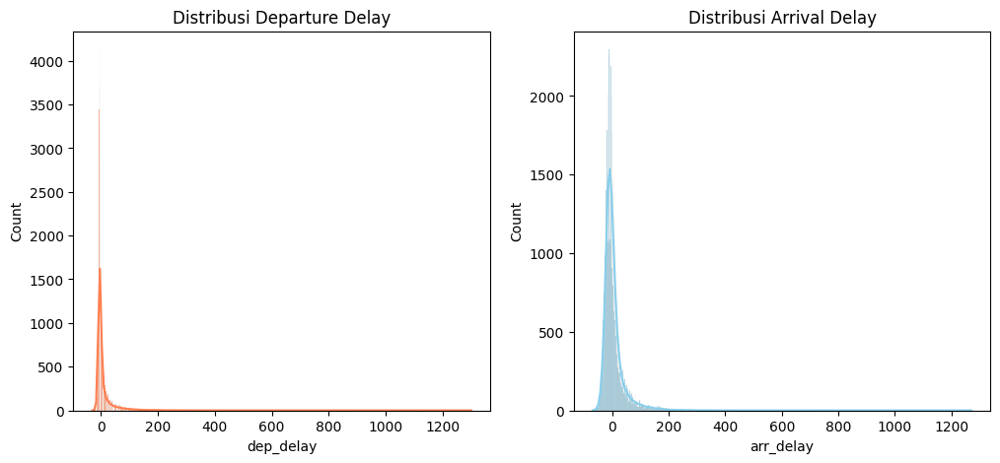

In [ ]:
# === Distribusi Delay (Histogram + KDE) ===
import matplotlib.pyplot as plt
import seaborn as sns

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
sns.histplot(df_clean['dep_delay'], kde=True, ax=axes[0], color='coral')
sns.histplot(df_clean['arr_delay'], kde=True, ax=axes[1], color='skyblue')

axes[0].set_title("Distribusi Departure Delay")
axes[1].set_title("Distribusi Arrival Delay")
plt.show()


In [ ]:
# Ambil sampel acak untuk uji normalitas
import numpy as np
from scipy.stats import shapiro
sample = df_clean['dep_delay'].dropna().sample(500, random_state=42)
stat, p = shapiro(sample)
print(f"Statistik Shapiro-Wilk: {stat:.4f}, p-value: {p:.4f}")

if p < 0.05:
    print("→ Data keterlambatan tidak berdistribusi normal.")
else:
    print("→ Data keterlambatan berdistribusi normal.")


Statistik Shapiro-Wilk: 0.4788, p-value: 0.0000
→ Data keterlambatan tidak berdistribusi normal.


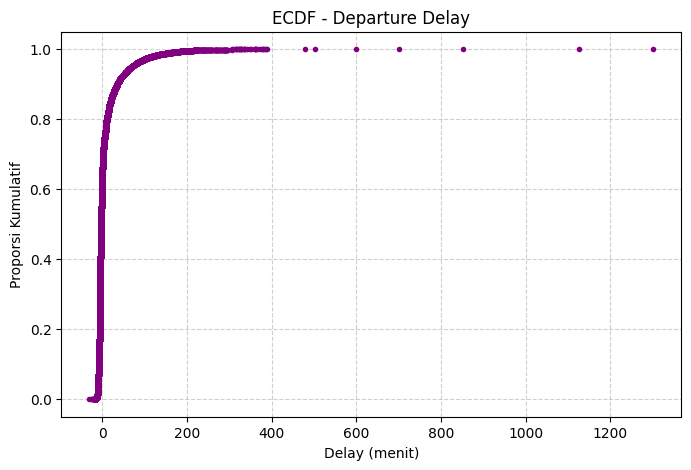

In [ ]:
# === ECDF (Empirical Cumulative Distribution Function) ===
x = np.sort(df_clean['dep_delay'].dropna())
y = np.arange(1, len(x)+1) / len(x)

plt.figure(figsize=(8,5))
plt.plot(x, y, marker='.', linestyle='none', color='purple')
plt.title('ECDF - Departure Delay')
plt.xlabel('Delay (menit)')
plt.ylabel('Proporsi Kumulatif')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()


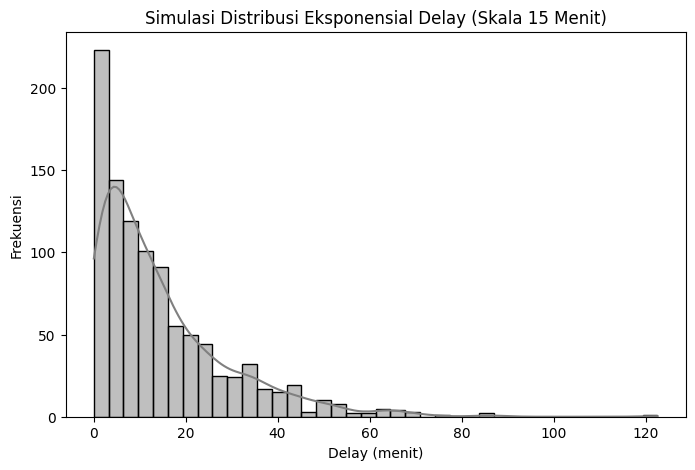

In [ ]:
# ===  Simulasi Sederhana (Distribusi Eksponensial) ===
np.random.seed(42)
simulasi_delay = np.random.exponential(scale=15, size=1000)  # rata-rata 15 menit

plt.figure(figsize=(8,5))
sns.histplot(simulasi_delay, kde=True, color='gray')
plt.title('Simulasi Distribusi Eksponensial Delay (Skala 15 Menit)')
plt.xlabel('Delay (menit)')
plt.ylabel('Frekuensi')
plt.show()


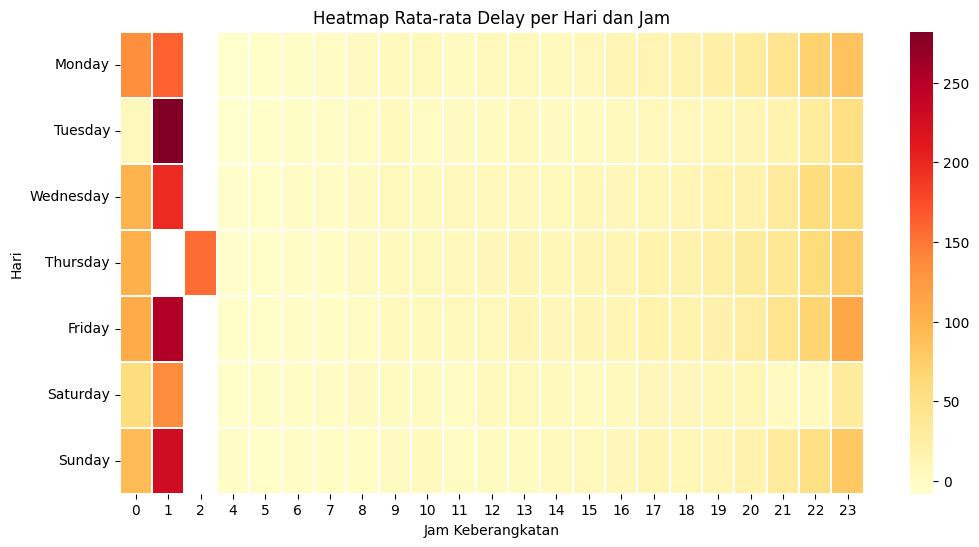

In [ ]:
pivot_delay = df_clean.pivot_table(
    values='dep_delay',
    index='day_of_week',
    columns='hour',
    aggfunc='mean'
).reindex(['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])

plt.figure(figsize=(12,6))
sns.heatmap(pivot_delay, cmap='YlOrRd', linewidths=0.3)
plt.title('Heatmap Rata-rata Delay per Hari dan Jam')
plt.xlabel('Jam Keberangkatan')
plt.ylabel('Hari')
plt.show()


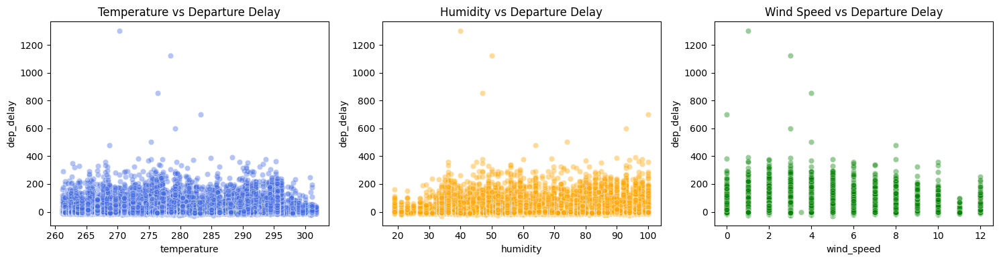

In [ ]:
# === Scatter Plot Cuaca vs Delay ===
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

sns.scatterplot(data=df_clean, x='temperature', y='dep_delay', color='royalblue', alpha=0.4, ax=axes[0])
sns.scatterplot(data=df_clean, x='humidity', y='dep_delay', color='orange', alpha=0.4, ax=axes[1])
sns.scatterplot(data=df_clean, x='wind_speed', y='dep_delay', color='green', alpha=0.4, ax=axes[2])

axes[0].set_title('Temperature vs Departure Delay')
axes[1].set_title('Humidity vs Departure Delay')
axes[2].set_title('Wind Speed vs Departure Delay')

plt.tight_layout()
plt.show()


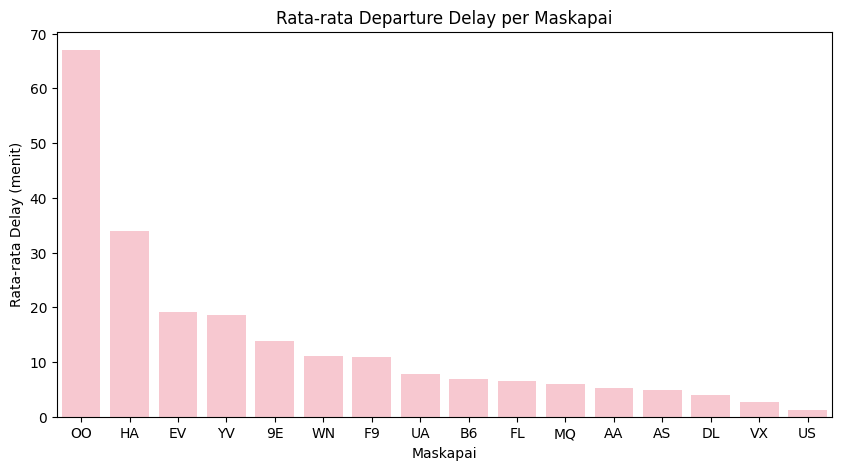

In [ ]:
# === Rata-rata Delay per Maskapai ===
avg_delay_carrier = df_clean.groupby('carrier')['dep_delay'].mean().sort_values(ascending=False)

plt.figure(figsize=(10,5))
sns.barplot(x=avg_delay_carrier.index, y=avg_delay_carrier.values, color='pink')
plt.title("Rata-rata Departure Delay per Maskapai")
plt.xlabel("Maskapai")
plt.ylabel("Rata-rata Delay (menit)")
plt.show()


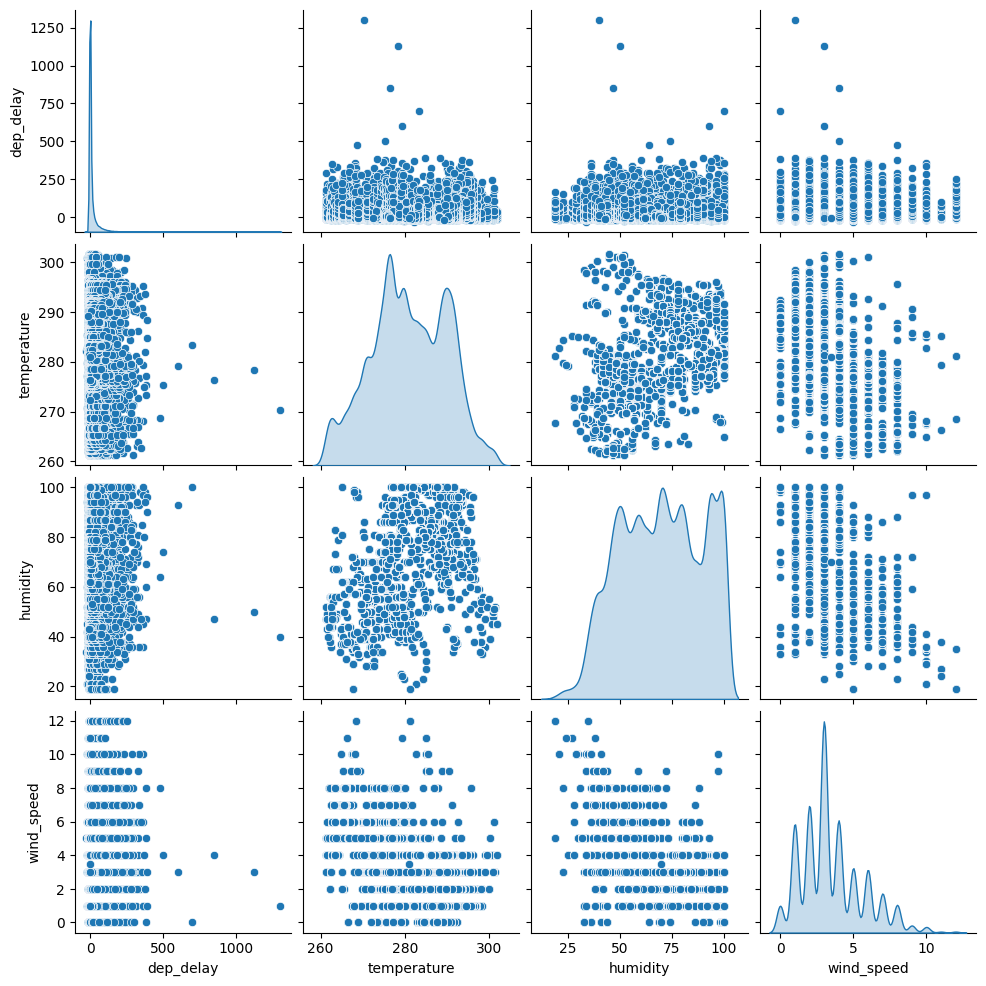

In [ ]:
# === Pairplot Cuaca & Delay ===
sns.pairplot(df_clean[['dep_delay', 'temperature', 'humidity', 'wind_speed']], diag_kind='kde')
plt.show()


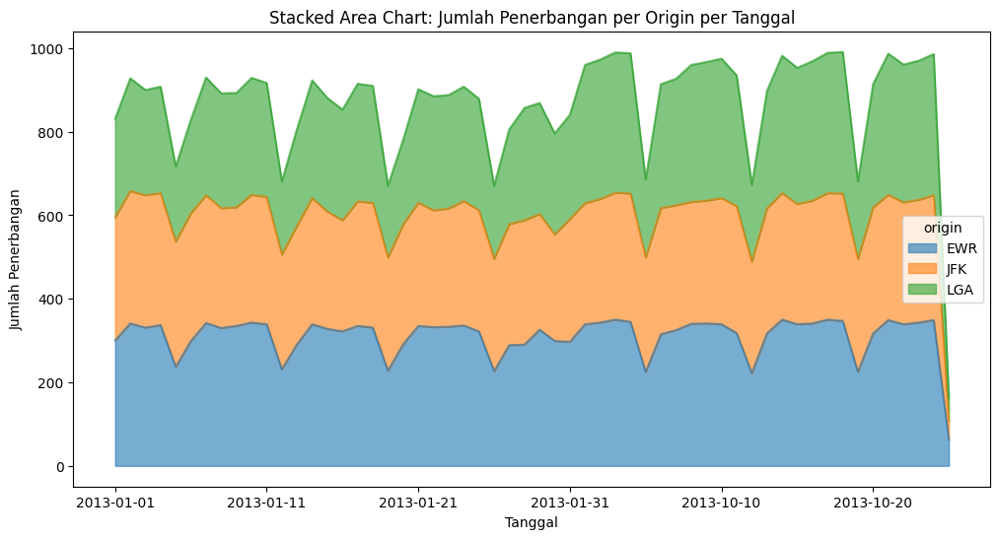

In [ ]:
# === Stacked Area: Jumlah Penerbangan per Tanggal & Bandara ===
df_area = df_clean.groupby(['date', 'origin']).size().reset_index(name='count')
pivot_area = df_area.pivot_table(index='date', columns='origin', values='count', aggfunc='sum')

pivot_area.plot.area(figsize=(12,6), alpha=0.6)
plt.title("Stacked Area Chart: Jumlah Penerbangan per Origin per Tanggal")
plt.xlabel("Tanggal")
plt.ylabel("Jumlah Penerbangan")
plt.show()


In [ ]:
# === Crosstab Maskapai vs Hari ===
table = pd.crosstab(df_clean['carrier'], df_clean['day_of_week'], values=df_clean['dep_delay'], aggfunc='mean').fillna(0)
print("Rata-rata Delay Maskapai per Hari:")
display(table)


Rata-rata Delay Maskapai per Hari:


day_of_week,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
carrier,,,,,,,
9E,18.371353,21.242507,9.628378,10.704678,12.257732,6.221219,18.204082
AA,7.347626,5.675039,2.753846,2.581699,8.085890,4.034048,5.436409
AS,5.466667,8.071429,-3.642857,12.142857,7.944444,-3.444444,8.111111
B6,9.186393,8.299903,4.803030,8.836735,8.341317,2.597871,6.052588
DL,5.577210,6.622807,1.753868,3.777108,5.083761,0.480035,3.930651
EV,25.601134,18.376085,3.930743,16.859852,30.535055,10.536052,20.113636
F9,16.285714,13.928571,-1.250000,0.928571,27.166667,-2.666667,15.277778
FL,10.279412,14.500000,-0.500000,5.315789,7.790698,0.569767,7.416667
HA,17.428571,10.142857,-1.857143,7.571429,0.800000,-3.600000,153.111111


In [ ]:
# === GroupBy Multi-Level: Bandara & Hari ===
grouped_delay = df_clean.groupby(['origin', 'day_of_week'])['dep_delay'].mean().unstack()
print("📊 Rata-rata Delay per Bandara & Hari:")
display(grouped_delay)


📊 Rata-rata Delay per Bandara & Hari:


day_of_week,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
origin,,,,,,,
EWR,15.852145,13.212446,5.300313,11.554979,18.957426,6.143962,12.309206
JFK,8.551819,9.797432,5.193146,7.422018,7.152885,3.605732,7.042199
LGA,8.415290,8.381205,-0.204925,2.368391,10.013423,2.016686,6.821536


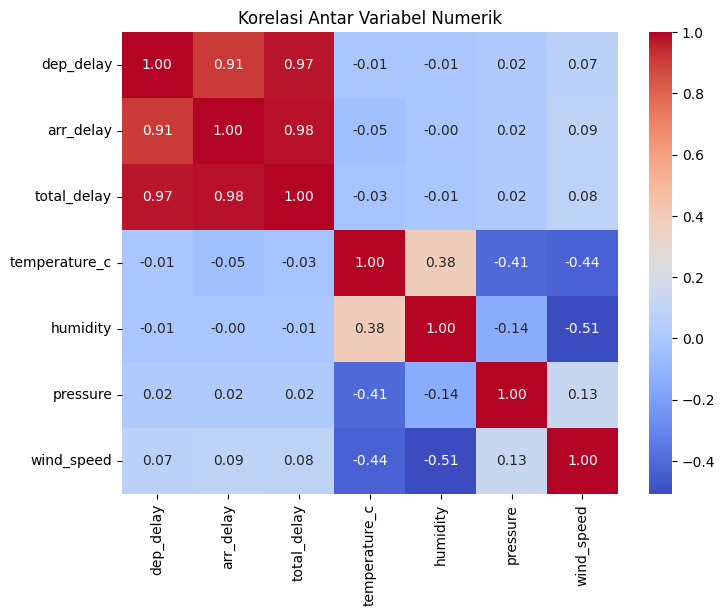

Korelasi dep_delay dengan variabel lain:
dep_delay        1.000000
total_delay      0.973765
arr_delay        0.906217
wind_speed       0.072777
pressure         0.018318
temperature_c   -0.008595
humidity        -0.011009
Name: dep_delay, dtype: float64


In [ ]:
num_cols = ['dep_delay', 'arr_delay', 'total_delay', 'temperature_c', 'humidity', 'pressure', 'wind_speed']
corr = df_clean[num_cols].corr()

plt.figure(figsize=(8,6))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Korelasi Antar Variabel Numerik')
plt.show()

print("Korelasi dep_delay dengan variabel lain:")
print(corr['dep_delay'].sort_values(ascending=False))


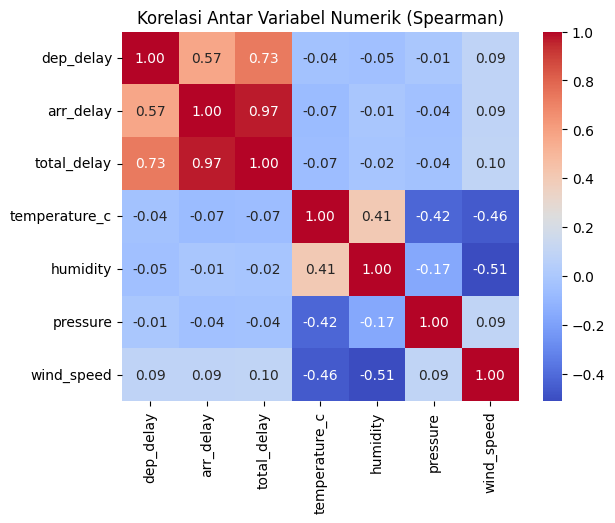

In [ ]:
spearman_corr = df_clean[num_cols].corr(method='spearman')

sns.heatmap(spearman_corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Korelasi Antar Variabel Numerik (Spearman)')
plt.show()


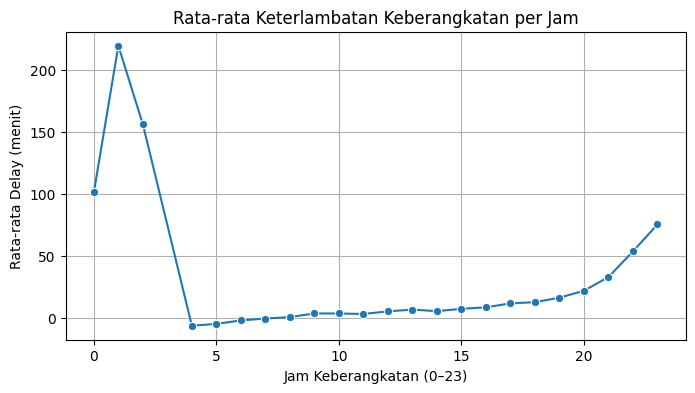

In [ ]:
# Pastikan kolom waktu adalah datetime
df_clean['dep_time'] = pd.to_datetime(df_clean['dep_time'], errors='coerce')

# Tambahkan kolom jam dan hari
df_clean['hour'] = df_clean['dep_time'].dt.hour
df_clean['day_of_week'] = df_clean['dep_time'].dt.day_name()

# Pola rata-rata delay per jam
delay_by_hour = df_clean.groupby('hour')['dep_delay'].mean()

plt.figure(figsize=(8,4))
sns.lineplot(x=delay_by_hour.index, y=delay_by_hour.values, marker='o')
plt.title('Rata-rata Keterlambatan Keberangkatan per Jam')
plt.xlabel('Jam Keberangkatan (0–23)')
plt.ylabel('Rata-rata Delay (menit)')
plt.grid(True)
plt.show()




/tmp/ipython-input-1573613798.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=delay_by_day.index, y=delay_by_day.values, palette='coolwarm')


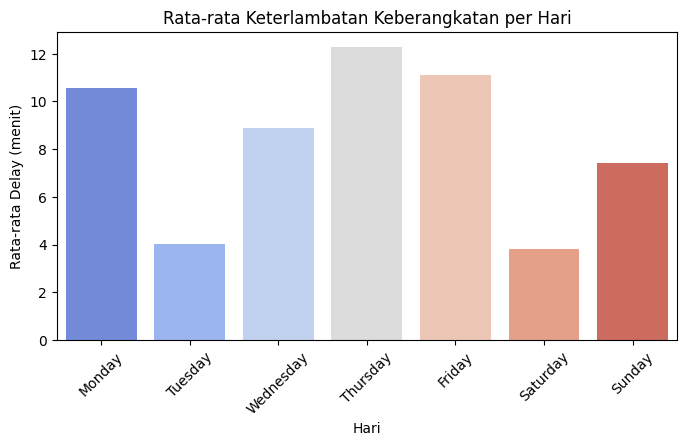

In [ ]:
# Pola rata-rata delay per hari
order = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
delay_by_day = df_clean.groupby('day_of_week')['dep_delay'].mean().reindex(order)

plt.figure(figsize=(8,4))
sns.barplot(x=delay_by_day.index, y=delay_by_day.values, palette='coolwarm')
plt.title('Rata-rata Keterlambatan Keberangkatan per Hari')
plt.xlabel('Hari')
plt.ylabel('Rata-rata Delay (menit)')
plt.xticks(rotation=45)
plt.show()

In [ ]:
# === Uji Kruskal-Wallis ===
from scipy.stats import kruskal

grouped = [group["dep_delay"].dropna() for name, group in df_clean.groupby("day_of_week")]
stat, p = kruskal(*grouped)
print(f"Hasil Uji Kruskal-Wallis antar Hari: stat={stat:.2f}, p-value={p:.4f}")

if p < 0.05:
    print("→ Ada perbedaan signifikan rata-rata delay antar hari.")
else:
    print("→ Tidak ada perbedaan signifikan antar hari.")

Hasil Uji Kruskal-Wallis antar Hari: stat=581.34, p-value=0.0000
→ Ada perbedaan signifikan rata-rata delay antar hari.


/tmp/ipython-input-2430679057.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top5.index, y=top5.values, palette='Reds')


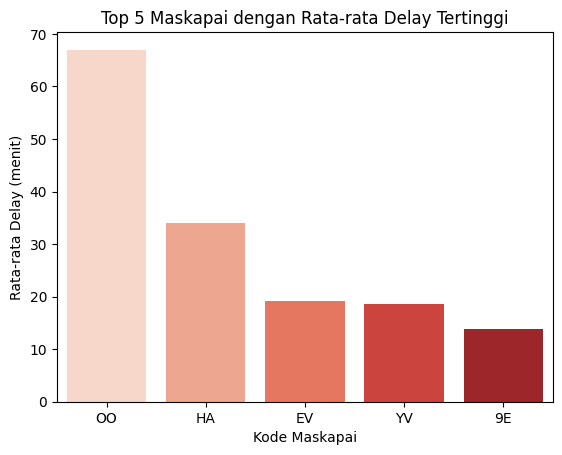

In [ ]:
top5 = df_clean.groupby('carrier')['dep_delay'].mean().sort_values(ascending=False).head(5)
sns.barplot(x=top5.index, y=top5.values, palette='Reds')
plt.title('Top 5 Maskapai dengan Rata-rata Delay Tertinggi')
plt.xlabel('Kode Maskapai')
plt.ylabel('Rata-rata Delay (menit)')
plt.show()


In [ ]:
# Contoh uji beda delay antara dua maskapai (AA vs DL)
from scipy.stats import mannwhitneyu

aa = df_clean[df_clean['carrier'] == 'AA']['dep_delay']
dl = df_clean[df_clean['carrier'] == 'DL']['dep_delay']

# Gunakan uji Mann-Whitney (non-parametrik)
stat, p = mannwhitneyu(aa, dl)
print(f"Hasil Uji Mann-Whitney (AA vs DL): stat={stat:.2f}, p-value={p:.5f}")

if p < 0.05:
    print("→ Ada perbedaan signifikan antara delay maskapai AA dan DL (p < 0.05)")
else:
    print("→ Tidak ada perbedaan signifikan antar maskapai.")

Hasil Uji Mann-Whitney (AA vs DL): stat=16467053.50, p-value=0.57894
→ Tidak ada perbedaan signifikan antar maskapai.


/tmp/ipython-input-3065326281.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_clean, x='temp_category', y='dep_delay', palette='coolwarm')


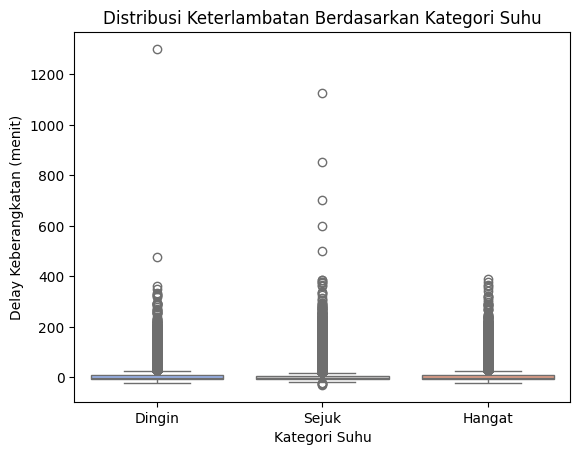

In [ ]:
sns.boxplot(data=df_clean, x='temp_category', y='dep_delay', palette='coolwarm')
plt.title('Distribusi Keterlambatan Berdasarkan Kategori Suhu')
plt.xlabel('Kategori Suhu')
plt.ylabel('Delay Keberangkatan (menit)')
plt.show()


# Visualisasi

In [ ]:
import pandas as pd

df = pd.read_csv("/content/flights_cleaned_fix.csv")
df

,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,carrier,flight,tailnum,origin,...,humidity,pressure,temperature,wind_speed,wind_direction,delay_difference,total_delay,temperature_c,temp_category,date
0,2013-01-01 05:17:00,2013-01-01 05:15:00,2.0,2013-01-01 08:30:00,2013-01-01 08:19:00,11.0,UA,1545,N14228,EWR,...,54.000000,1022.0000,270.640000,6.000000,300.000000,9.0,13.0,-2.510000,Dingin,2013-01-01
1,2013-01-01 05:33:00,2013-01-01 05:29:00,4.0,2013-01-01 08:50:00,2013-01-01 08:30:00,20.0,UA,1714,N24211,LGA,...,54.000000,1022.0000,270.640000,6.000000,300.000000,16.0,24.0,-2.510000,Dingin,2013-01-01
2,2013-01-01 05:42:00,2013-01-01 05:40:00,2.0,2013-01-01 09:23:00,2013-01-01 08:50:00,33.0,AA,1141,N619AA,JFK,...,54.000000,1022.0000,270.640000,6.000000,300.000000,31.0,35.0,-2.510000,Dingin,2013-01-01
3,2013-01-01 05:44:00,2013-01-01 05:45:00,-1.0,2013-01-01 10:04:00,2013-01-01 10:22:00,-18.0,B6,725,N804JB,JFK,...,54.000000,1022.0000,270.640000,6.000000,300.000000,-17.0,-19.0,-2.510000,Dingin,2013-01-01
4,2013-01-01 05:54:00,2013-01-01 06:00:00,-6.0,2013-01-01 08:12:00,2013-01-01 08:37:00,-25.0,DL,461,N668DN,LGA,...,69.773245,1014.1724,269.980000,1.000000,292.000000,-19.0,-31.0,-3.170000,Dingin,2013-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48785,2013-10-25 08:03:00,2013-10-25 08:10:00,-7.0,2013-10-25 11:04:00,2013-10-25 11:19:00,-15.0,UA,327,N813UA,EWR,...,71.000000,981.0000,276.350000,3.000000,244.000000,-8.0,-22.0,3.200000,Sejuk,2013-10-25
48786,2013-10-25 08:03:00,2013-10-25 07:55:00,8.0,2013-10-25 09:12:00,2013-10-25 09:10:00,2.0,WN,909,N468WN,EWR,...,69.000000,981.0000,275.950000,3.000000,244.000000,-6.0,10.0,2.800000,Sejuk,2013-10-25
48787,2013-10-25 08:03:00,2013-10-25 08:05:00,-2.0,2013-10-25 11:02:00,2013-10-25 11:06:00,-4.0,DL,1109,N322NB,LGA,...,71.000000,981.0000,276.350000,3.000000,244.000000,-2.0,-6.0,3.200000,Sejuk,2013-10-25
48788,2013-10-25 08:04:00,2013-10-25 08:10:00,-6.0,2013-10-25 09:37:00,2013-10-25 09:55:00,-18.0,MQ,3272,N802MQ,LGA,...,71.000000,981.0000,276.350000,3.000000,244.000000,-12.0,-24.0,3.200000,Sejuk,2013-10-25


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48790 entries, 0 to 48789
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   dep_time          48790 non-null  object 
 1   sched_dep_time    48790 non-null  object 
 2   dep_delay         48790 non-null  float64
 3   arr_time          48790 non-null  object 
 4   sched_arr_time    48790 non-null  object 
 5   arr_delay         48790 non-null  float64
 6   carrier           48790 non-null  object 
 7   flight            48790 non-null  int64  
 8   tailnum           48790 non-null  object 
 9   origin            48790 non-null  object 
 10  dest              48790 non-null  object 
 11  air_time          48790 non-null  float64
 12  distance          48790 non-null  int64  
 13  humidity          48790 non-null  float64
 14  pressure          48790 non-null  float64
 15  temperature       48790 non-null  float64
 16  wind_speed        48790 non-null  float6

In [ ]:
%matplotlib notebook
!pip install --upgrade plotly

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.8/9.8 MB 55.8 MB/s eta 0:00:00
  Attempting uninstall: plotly
    Found existing installation: plotly 5.24.1
    Uninstalling plotly-5.24.1:
      Successfully uninstalled plotly-5.24.1


In [ ]:
import plotly.graph_objects as go
import pandas as pd

# Pastikan date bertipe datetime
df['date'] = pd.to_datetime(df['date'])

# Hitung rata-rata total_delay per tanggal
daily_delay = df.groupby('date')['total_delay'].mean().reset_index()

# Cari titik delay tertinggi
max_idx = daily_delay['total_delay'].idxmax()
max_date = daily_delay.loc[max_idx, 'date']
max_value = daily_delay.loc[max_idx, 'total_delay']

# Hitung rata-rata keseluruhan
mean_delay = daily_delay['total_delay'].mean()

# Buat figure
fig = go.Figure()

# Line utama
fig.add_trace(go.Scatter(
    x=daily_delay['date'],
    y=daily_delay['total_delay'],
    mode='lines+markers',
    name='Rata-rata Harian',
    line=dict(color='#0074D9', width=3),
    marker=dict(size=5, color='#005B96')
))

# Highlight titik tertinggi
fig.add_trace(go.Scatter(
    x=[max_date],
    y=[max_value],
    mode='markers+text',
    name='Tertinggi',
    marker=dict(color='red', size=12),
    text=[f'{max_value:.1f}'],
    textposition='top center'
))

# Garis rata-rata
fig.add_hline(
    y=mean_delay,
    line_dash="dash",
    line_color='#005B96',
    annotation_text=f"Rata-rata: {mean_delay:.1f} menit",
    annotation_position="bottom right"
)

# Layout
fig.update_layout(
    title='Tren Keterlambatan Harian',
    xaxis_title="Tanggal",
    yaxis_title="Rata-rata Total Delay (menit)",
    template='plotly_white',
    hovermode="x unified",
    title_font=dict(size=18, color='#0074D9', family='Arial')
)

fig.show()


In [ ]:
import plotly.express as px
import pandas as pd

# Hitung rata-rata keterlambatan kedatangan per maskapai
avg_delay = df.groupby('carrier')['arr_delay'].mean().reset_index()
avg_delay.columns = ['carrier', 'avg_arr_delay']

# Balik tanda delay: terlambat -> negatif, lebih cepat -> positif
avg_delay['adjusted_delay'] = -avg_delay['avg_arr_delay']

# Plot grafik horizontal
fig = px.bar(
    avg_delay.sort_values('adjusted_delay', ascending=True),
    x='adjusted_delay',
    y='carrier',
    orientation='h',
    color='adjusted_delay',
    color_continuous_scale=['navy', 'blue', 'skyblue'],
    title='Performa Ketepatan Waktu Kedatangan per Maskapai (Nilai Positif = Lebih Cepat)'
)

fig.update_layout(
    xaxis_title="Nilai Performa (menit)",
    yaxis_title="Kode Maskapai",
    title_font=dict(size=16, color='#0074D9', family='Arial'),
    plot_bgcolor='white'
)

fig.show()


In [ ]:
import plotly.express as px
import pandas as pd

# === Baca dataset hasil dari Wrangler ===
df_clean = pd.read_csv("/content/flights_cleaned_fix.csv")

# Pastikan kolom date bertipe datetime
df_clean['date'] = pd.to_datetime(df_clean['date'], errors='coerce')

# Ambil nama hari dari date
df_clean['day_of_week'] = df_clean['date'].dt.day_name()

# Buang baris yang tidak punya nilai delay atau hari
df_clean = df_clean.dropna(subset=['dep_delay', 'day_of_week'])

# Urutan hari (supaya tidak acak)
order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
delay_by_day = df_clean.groupby('day_of_week')['dep_delay'].mean().reindex(order).reset_index()

# Cek isi
print(delay_by_day)

# Plot
fig = px.bar(
    delay_by_day,
    x='day_of_week',
    y='dep_delay',
    title='Rata-rata Keterlambatan Keberangkatan per Hari',
    labels={'day_of_week':'Hari', 'dep_delay':'Rata-rata Delay (menit)'}
)

# Tema biru bold
fig.update_traces(marker_color='#0074D9')

fig.update_layout(
    xaxis_title="Hari",
    yaxis_title="Rata-rata Delay (menit)",
    title_font=dict(size=18, color='#0074D9', family='Arial'),
    plot_bgcolor='white'
)

fig.show()


  day_of_week  dep_delay
0      Monday  10.568531
1     Tuesday   4.015381
2   Wednesday   8.888066
3    Thursday  12.304044
4      Friday  11.128232
5    Saturday   3.807113
6      Sunday   7.399899


In [ ]:
import plotly.express as px

# Pastikan wind_speed dan arr_delay tidak kosong
scatter_data = df_clean.dropna(subset=['wind_speed', 'arr_delay'])

fig = px.scatter(
    scatter_data,
    x='wind_speed',
    y='arr_delay',
    title='Pengaruh Kecepatan Angin terhadap Keterlambatan',
    labels={'wind_speed': 'Kecepatan Angin', 'arr_delay': 'Keterlambatan Tiba (menit)'},
    opacity=0.6
)

# Tema biru bold
fig.update_traces(marker=dict(color='#0074D9'))

fig.update_layout(
    xaxis_title="Kecepatan Angin",
    yaxis_title="Keterlambatan Tiba (menit)",
    title_font=dict(size=18, color='#0074D9', family='Arial'),
    plot_bgcolor='white'
)

fig.show()


In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Buat subplot dengan 3 kolom
fig = make_subplots(
    rows=1, cols=3,
    subplot_titles=("Temperature vs Delay", "Humidity vs Delay", "Wind Speed vs Delay"),
    horizontal_spacing=0.08
)

# Warna gradasi biru profesional
colors = ['#003f7f', '#0074D9', '#7FDBFF']  # navy, biru, skyblue

# 1️⃣ Temperature vs dep_delay
fig.add_trace(go.Scatter(
    x=df['temperature'],
    y=df['dep_delay'],
    mode='markers',
    name='Temperature',
    marker=dict(color=colors[0], size=6, opacity=0.6),
    hovertemplate='Temperature: %{x:.2f}°C<br>Delay: %{y:.1f} menit<extra></extra>'
), row=1, col=1)

# 2️⃣ Humidity vs dep_delay
fig.add_trace(go.Scatter(
    x=df['humidity'],
    y=df['dep_delay'],
    mode='markers',
    name='Humidity',
    marker=dict(color=colors[1], size=6, opacity=0.6),
    hovertemplate='Humidity: %{x:.2f}%<br>Delay: %{y:.1f} menit<extra></extra>'
), row=1, col=2)

# 3️⃣ Wind Speed vs dep_delay
fig.add_trace(go.Scatter(
    x=df['wind_speed'],
    y=df['dep_delay'],
    mode='markers',
    name='Wind Speed',
    marker=dict(color=colors[2], size=6, opacity=0.6),
    hovertemplate='Wind Speed: %{x:.2f} km/h<br>Delay: %{y:.1f} menit<extra></extra>'
), row=1, col=3)

# Layout dengan background putih penuh
fig.update_layout(
    title=dict(
        text='Hubungan Faktor Cuaca terhadap Keterlambatan Keberangkatan',
        font=dict(size=22, color='#003F7F', family='Arial Black'),
        x=0.5, y=0.97
    ),
    plot_bgcolor='white',          # area dalam plot putih
    paper_bgcolor='white',         # keseluruhan latar putih (tidak transparan)
    showlegend=False,
    font=dict(color='#003F7F', size=12),
    margin=dict(t=120, b=70, l=50, r=40)
)

# Label sumbu
fig.update_xaxes(title_text="Temperature (°C)", row=1, col=1)
fig.update_xaxes(title_text="Humidity (%)", row=1, col=2)
fig.update_xaxes(title_text="Wind Speed (km/h)", row=1, col=3)

fig.update_yaxes(title_text="Delay (menit)", row=1, col=1)
fig.update_yaxes(showticklabels=False, row=1, col=2)
fig.update_yaxes(showticklabels=False, row=1, col=3)

fig.show()


In [ ]:
import plotly.express as px
import pandas as pd

# Buat salinan data yang dipakai untuk scatter bubble
bubble_data = df[['humidity', 'delay_difference', 'distance', 'origin', 'carrier']].copy()

# Hapus baris kosong biar tidak error
bubble_data = bubble_data.dropna(subset=['humidity', 'delay_difference', 'distance'])

# Buat visualisasi
fig = px.scatter(
    bubble_data,
    x='humidity',
    y='delay_difference',
    size='distance',
    color='delay_difference',
    hover_data=['origin', 'carrier'],  # tampilkan info tambahan saat hover
    size_max=40,  # batas ukuran bubble biar gak terlalu gede
    color_continuous_scale=['#003366', '#0074D9', '#66B3FF', '#B3E5FF'],
    title='Hubungan Kelembaban, Delay, dan Jarak Tempuh',
    labels={
        'humidity': 'Kelembaban (%)',
        'delay_difference': 'Delay Difference (menit)',
        'distance': 'Jarak Tempuh (km)'
    },
    opacity=0.7
)

# Styling dashboard
fig.update_layout(
    xaxis_title="Kelembaban (%)",
    yaxis_title="Selisih Delay (menit)",
    title_font=dict(size=18, color='#003F7F', family='Arial Black'),
    plot_bgcolor='white',
    paper_bgcolor='white',
    font=dict(color='#003F7F', size=12),
    coloraxis_colorbar_title="Delay (menit)",
    showlegend=False
)

# Hilangkan border bubble
fig.update_traces(marker=dict(line=dict(width=0)))

fig.show()


In [ ]:
import plotly.express as px
import pandas as pd
import numpy as np

# Pastikan date datetime & siapkan bulan
df_clean['date'] = pd.to_datetime(df_clean['date'], errors='coerce')
df_clean['month'] = df_clean['date'].dt.to_period('M').astype(str)

# Hitung jumlah penerbangan per carrier per bulan
monthly_carrier = df_clean.groupby(['month', 'carrier']).size().reset_index(name='flight_count')

# Ambil daftar carrier unik
unique_carriers = monthly_carrier['carrier'].unique()
n = len(unique_carriers)

# Generator palet biru dari navy ke pastel (unlimited)
def generate_blue_gradient(n):
    # Komponen RGB: mulai dari navy tua → pastel muda
    start = np.array([0, 31, 63])    # #001F3F
    end = np.array([163, 216, 255])  # #A3D8FF
    colors = [
        f'rgb({int(start[0] + (end[0] - start[0]) * i / (n-1))},'
        f'{int(start[1] + (end[1] - start[1]) * i / (n-1))},'
        f'{int(start[2] + (end[2] - start[2]) * i / (n-1))})'
        for i in range(n)
    ]
    return colors

blue_palette = generate_blue_gradient(n)
color_map = dict(zip(unique_carriers, blue_palette))

# Plot
fig = px.area(
    monthly_carrier,
    x='month',
    y='flight_count',
    color='carrier',
    title='Porsi Maskapai dari Waktu ke Waktu',
    labels={'month': 'Bulan', 'flight_count': 'Jumlah Penerbangan', 'carrier': 'Maskapai'},
    color_discrete_map=color_map
)

fig.update_layout(
    xaxis_title="Bulan",
    yaxis_title="Jumlah Penerbangan",
    title_font=dict(size=18, color='#003F7F', family='Arial'),
    plot_bgcolor='white',
    legend_title_text='Maskapai'
)

fig.show()


In [ ]:
import plotly.express as px
import pandas as pd
import numpy as np

# Hitung total penerbangan per carrier
carrier_total = df_clean.groupby('carrier').size().reset_index(name='flight_count')

# Ambil daftar carrier
unique_carriers = carrier_total['carrier'].unique()
n = len(unique_carriers)

# Generator palet biru navy → pastel
def generate_blue_gradient(n):
    start = np.array([0, 31, 63])    # Navy (#001F3F)
    end = np.array([163, 216, 255])  # Pastel (#A3D8FF)
    return [
        f'rgb({int(start[0] + (end[0] - start[0]) * i / (n-1))},'
        f'{int(start[1] + (end[1] - start[1]) * i / (n-1))},'
        f'{int(start[2] + (end[2] - start[2]) * i / (n-1))})'
        for i in range(n)
    ]

blue_palette = generate_blue_gradient(n)
color_map = dict(zip(unique_carriers, blue_palette))

# Pie Chart
fig = px.pie(
    carrier_total,
    names='carrier',
    values='flight_count',
    title='Jumlah Penerbangan Maskapai Secara Keseluruhan',
    color='carrier',
    color_discrete_map=color_map,
    hole=0.3  # jadi donut untuk kesan modern
)

# Styling
fig.update_layout(
    title_font=dict(size=18, color='#003F7F', family='Arial'),
    legend_title_text='Maskapai'
)

fig.show()


In [ ]:
import plotly.graph_objects as go
import pandas as pd

# Buat kolom rute
df['route'] = df['origin'] + ' → ' + df['dest']

# Hitung rata-rata keterlambatan per rute
route_delay = df.groupby('route')['arr_delay'].mean().sort_values(ascending=False).head(15).reset_index()

# Buat chart
fig = go.Figure()

# Garis (stick lolipop)
fig.add_trace(go.Scatter(
    x=route_delay['arr_delay'],
    y=route_delay['route'],
    mode='lines',
    line=dict(color='lightgray', width=4),
    showlegend=False
))

# Titik (lollipop head)
fig.add_trace(go.Scatter(
    x=route_delay['arr_delay'],
    y=route_delay['route'],
    mode='markers',
    marker=dict(size=14, color='#2563EB', line=dict(width=2, color='white')),
    name='Rata-rata Delay'
))

# Layout aesthetic
fig.update_layout(
    title='✈️ Top 15 Rute dengan Keterlambatan Kedatangan Tertinggi',
    title_x=0.5,
    xaxis_title='Rata-rata Keterlambatan (menit)',
    yaxis_title='Rute Penerbangan',
    template='plotly_white',
    font=dict(size=12),
    xaxis=dict(showgrid=True, gridcolor='rgba(200,200,200,0.2)'),
    yaxis=dict(categoryorder='total ascending'),
    margin=dict(l=120, r=50, t=80, b=50),
    plot_bgcolor='rgba(0,0,0,0)',
)

fig.show()


In [ ]:
import plotly.graph_objects as go
import pandas as pd

# Hitung total penerbangan per carrier
carrier_total = df_clean.groupby('carrier').size().reset_index(name='flight_count')

# Hitung persentase
carrier_total['percentage'] = (carrier_total['flight_count'] / carrier_total['flight_count'].sum() * 100).round(2)

# Buat tabel
fig = go.Figure(data=[go.Table(
    header=dict(
        values=['<b>Maskapai</b>', '<b>Jumlah Penerbangan</b>', '<b>Porsi (%)</b>'],
        fill_color='#003F7F',  # Navy
        font=dict(color='white', size=14),
        align='center'
    ),
    cells=dict(
        values=[carrier_total['carrier'], carrier_total['flight_count'], carrier_total['percentage']],
        fill_color=[['#E6F2FF' if i % 2 == 0 else '#FFFFFF' for i in range(len(carrier_total))]],  # Alternating row color
        font=dict(color='#003F7F', size=12),
        align='center'
    )
)])

# Layout styling
fig.update_layout(
    title='Ringkasan Jumlah Penerbangan per Maskapai',
    title_font=dict(size=18, color='#003F7F', family='Arial'),
    margin=dict(l=0, r=0, t=50, b=0)
)

fig.show()


In [ ]:
print(df.columns)

Index(['dep_time', 'sched_dep_time', 'dep_delay', 'arr_time', 'sched_arr_time',
       'arr_delay', 'carrier', 'flight', 'tailnum', 'origin', 'dest',
       'air_time', 'distance', 'humidity', 'pressure', 'temperature',
       'wind_speed', 'wind_direction', 'delay_difference', 'total_delay',
       'temperature_c', 'temp_category', 'date', 'route'],
      dtype='object')


In [ ]:
import plotly.express as px

# Tangani nilai NaN agar tidak menyebabkan error
df['wind_speed'] = df['wind_speed'].fillna(0)
df['total_delay'] = df['total_delay'].fillna(0)
df['dep_delay'] = df['dep_delay'].fillna(0)
df['arr_delay'] = df['arr_delay'].fillna(0)

# Buat kolom skala kecepatan angin
df['wind_speed_scaled'] = df['wind_speed'] * 50

# Scatter polar plot per maskapai
fig = px.scatter_polar(
    df,
    r='wind_speed_scaled',
    theta='carrier',  # kategori arah polar
    color='total_delay',  # warna berdasarkan total keterlambatan
    size='wind_speed',  # ukuran titik
    hover_data=['dep_delay', 'arr_delay'],
    title='Pola Kecepatan Angin dan Keterlambatan per Maskapai',
    color_continuous_scale='Blues'
)

# Layout tambahan
fig.update_layout(
    template='plotly_white',
    legend_title_text='Total Delay (menit)',
    margin=dict(l=50, r=50, t=80, b=50),
    polar=dict(
        angularaxis=dict(
            direction='clockwise',
            tickfont=dict(size=10)
        )
    )
)
import plotly.io as pio
pio.renderers.default = 'notebook_connected'  # atau 'colab' kalau di Google Colab

# Tampilkan grafik
fig.show()

In [ ]:
import plotly.express as px

# Tangani nilai NaN agar tidak menyebabkan error
df['wind_direction'] = df['wind_direction'].fillna(0)
df['total_delay'] = df['total_delay'].fillna(0)
df['dep_delay'] = df['dep_delay'].fillna(0)
df['arr_delay'] = df['arr_delay'].fillna(0)

# Buat kolom skala kecepatan angin
df['wind_direction_scaled'] = df['wind_direction'] * 50

# Scatter polar plot per maskapai
fig = px.scatter_polar(
    df,
    r='wind_direction_scaled',
    theta='carrier',  # kategori arah polar
    color='total_delay',  # warna berdasarkan total keterlambatan
    size='wind_direction',  # ukuran titik
    hover_data=['dep_delay', 'arr_delay'],
    title='Pola Arah Mata Angin dan Keterlambatan per Maskapai',
    color_continuous_scale='Blues'
)

# Layout tambahan
fig.update_layout(
    template='plotly_white',
    legend_title_text='Total Delay (menit)',
    margin=dict(l=50, r=50, t=80, b=50),
    polar=dict(
        angularaxis=dict(
            direction='clockwise',
            tickfont=dict(size=10)
        )
    )
)
import plotly.io as pio
pio.renderers.default = 'notebook_connected'  # atau 'colab' kalau di Google Colab

# Tampilkan grafik
fig.show()

In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# --- Pastikan kolom delay ada ---
if 'dep_delay' not in df.columns or 'arr_delay' not in df.columns:
    raise ValueError("Pastikan kolom 'dep_delay' dan 'arr_delay' ada di dataset kamu.")

# --- Siapkan data (hapus nilai kosong dan outlier ekstrem agar grafik rapi) ---
df_delay = df[['dep_delay', 'arr_delay']].dropna()
df_delay = df_delay[(df_delay['dep_delay'] < 500) & (df_delay['arr_delay'] < 500)]

# --- Buat subplot 1 baris 2 kolom ---
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=('Distribusi Keterlambatan Keberangkatan', 'Distribusi Keterlambatan Kedatangan')
)

# --- Histogram 1: Departure Delay ---
fig.add_trace(
    go.Histogram(
        x=df_delay['dep_delay'],
        nbinsx=50,
        marker_color='#004C99',  # biru tua
        opacity=0.8,
        name='Departure Delay',
        hovertemplate='Delay: %{x:.0f} menit<br>Frekuensi: %{y}<extra></extra>'
    ),
    row=1, col=1
)

# --- Histogram 2: Arrival Delay ---
fig.add_trace(
    go.Histogram(
        x=df_delay['arr_delay'],
        nbinsx=50,
        marker_color='#66B3FF',  # biru muda
        opacity=0.8,
        name='Arrival Delay',
        hovertemplate='Delay: %{x:.0f} menit<br>Frekuensi: %{y}<extra></extra>'
    ),
    row=1, col=2
)

# --- Layout Dashboard Style ---
fig.update_layout(
    title='Perbandingan Distribusi Keterlambatan Keberangkatan dan Kedatangan',
    title_font=dict(size=20, color='#003F7F', family='Arial Black'),
    font=dict(color='#003F7F', size=12),
    plot_bgcolor='white',
    paper_bgcolor='white',
    bargap=0.05,
    showlegend=False,
    margin=dict(t=100, b=70, l=50, r=50)
)

# --- Update axis style ---
fig.update_xaxes(title_text='Delay (menit)', gridcolor='#E0E0E0')
fig.update_yaxes(title_text='Frekuensi', gridcolor='#E0E0E0')

# --- Tampilkan hasil ---
fig.show()


In [ ]:
import plotly.graph_objects as go
import pandas as pd
import numpy as np

# Hitung rata-rata temperature per destination
temp_dest = df_clean.groupby('dest')['temperature'].mean().reset_index()

# Sort untuk rapi
temp_dest = temp_dest.sort_values('temperature')

# Ambil maksimal 15 bandara saja biar tidak terlalu padat
temp_dest = temp_dest.tail(15)

# Buat warna biru gradasi navy → pastel
unique_dest = temp_dest['dest'].unique()
n = len(unique_dest)

def generate_blue_gradient(n):
    start = np.array([0, 31, 63])
    end = np.array([163, 216, 255])
    return [
        f'rgb({int(start[0] + (end[0] - start[0]) * i / (n-1))},'
        f'{int(start[1] + (end[1] - start[1]) * i / (n-1))},'
        f'{int(start[2] + (end[2] - start[2]) * i / (n-1))})'
        for i in range(n)
    ]

colors = generate_blue_gradient(n)

fig = go.Figure()

fig.add_trace(go.Scatter(
    x=temp_dest['dest'],
    y=temp_dest['temperature'],
    mode='lines',
    line=dict(color='lightgray', width=2),
    showlegend=False
))

fig.add_trace(go.Scatter(
    x=temp_dest['dest'],
    y=temp_dest['temperature'],
    mode='markers',
    marker=dict(size=14, color=colors),
    showlegend=False
))

fig.update_layout(
    title='Perbandingan Temperatur Tiap Bandara Tujuan',
    xaxis_title='Bandara Tujuan (Dest)',
    yaxis_title='Rata-rata Temperatur (°C)',
    title_font=dict(size=18, color='#003F7F', family='Arial'),
    plot_bgcolor='white'
)

fig.show()


In [ ]:
import plotly.express as px
import pandas as pd
import numpy as np

# Pastikan data tidak null
bubble_data = df_clean.dropna(subset=['wind_speed', 'delay_difference', 'temperature', 'carrier'])

# Ambil daftar carrier unik
unique_carriers = bubble_data['carrier'].unique()
n = len(unique_carriers)

# Generator palet biru navy → pastel
def generate_blue_gradient(n):
    start = np.array([0, 31, 63])
    end = np.array([163, 216, 255])  # Pastel (#A3D8FF)
    return [
        f'rgb({int(start[0] + (end[0] - start[0]) * i / (n-1))},'
        f'{int(start[1] + (end[1] - start[1]) * i / (n-1))},'
        f'{int(start[2] + (end[2] - start[2]) * i / (n-1))})'
        for i in range(n)
    ]

blue_palette = generate_blue_gradient(n)
color_map = dict(zip(unique_carriers, blue_palette))

# Bubble Chart
fig = px.scatter(
    bubble_data,
    x='wind_speed',
    y='delay_difference',
    size='temperature',
    color='carrier',
    color_discrete_map=color_map,
    title='Pengaruh Kecepatan Angin terhadap Delay Difference per Maskapai',
    labels={
        'wind_speed': 'Kecepatan Angin (mph)',
        'delay_difference': 'Delay Difference (menit)',
        'temperature': 'Temperatur (°C)',
        'carrier': 'Maskapai'
    },
    opacity=0.7
)

fig.update_layout(
    xaxis_title="Kecepatan Angin (mph)",
    yaxis_title="Delay Difference (menit)",
    title_font=dict(size=18, color='#003F7F', family='Arial'),
    plot_bgcolor='white',
    legend_title_text='Maskapai'
)

fig.show()


In [ ]:
import plotly.express as px
import pandas as pd

corr_data = df_clean[['wind_speed', 'humidity', 'temperature', 'delay_difference']].corr()

fig = px.imshow(
    corr_data,
    text_auto=True,
    title='Korelasi Faktor Cuaca terhadap Delay Difference',
    color_continuous_scale=['#001F3F', '#003F7F', '#0074D9', '#66BFFF', '#A3D8FF']  # full blue gradient
)


fig.update_layout(
    title_font=dict(size=18, color='#003F7F', family='Arial'),
    xaxis_title="Variabel",
    yaxis_title="Variabel"
)

fig.show()
